<h1>Предобработка и анализ данных потребления ледовой арены и ее физических параметров</h1>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [2]:
sns.set_theme()

In [3]:
data = pd.read_csv('../data/data.csv')

# <h2>Описание набора данных</h2>

- time - время в минутах
- temp_ice - температура поверхности льда, градусы
- consumption_compressors - потребление суммы компрессоров, кВт*ч
- power_pump - мощность работы циркуляционного насоса, Вт
- temp_outside - внешняя температура, градусы
- hum_outside - относительная внешняя влажность, %
- temp_inside - внутренняя температура над помещением ледового поля, градусы
- hum_inside - относительная внутреняя влажность над помещением ледового поля, %
- max_motion - уровень движения на ледовой арене, у.е.
- illuminance - уровень освещения на ледовой арене, у.е.
- CO2 - уровень углекислого газа на ледовой арене, ppm
- temp_condensation - температура фреона в испарителе, градусы
- power_compressors - мощность работы компрессоров, Вт
- power_condensators - мощность работы конденсаторов, Вт
- temp_supply_glyc - температура подачи теплоносителя (гликоля) в контур охлаждающих труб
- temp_return_glyc - температура возращаемого теплоносителя (гликоля) из контура охлаждающих труб

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 551225 entries, 0 to 551224
Data columns (total 16 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   time                     551225 non-null  object 
 1   power_pump               549008 non-null  float64
 2   temp_ice                 545417 non-null  float64
 3   temp_outside             539520 non-null  float64
 4   hum_outside              539520 non-null  float64
 5   temp_inside              536766 non-null  float64
 6   hum_inside               547838 non-null  float64
 7   max_motion               548127 non-null  float64
 8   illuminance              455332 non-null  float64
 9   CO2                      368578 non-null  float64
 10  temp_condensation        409372 non-null  float64
 11  consumption_compressors  551225 non-null  float64
 12  power_compressors        551225 non-null  float64
 13  power_condensators       551225 non-null  float64
 14  temp

In [5]:
# data.describe().round(2).T.to_excel('../data/raw_describe_data.xlsx')

In [6]:
data['time'] = pd.to_datetime(data['time'])

In [7]:
# Количество пропущенных данных в %
data.isna().sum().sort_values(ascending=False) / len(data)

CO2                        0.331347
temp_return_glycol         0.268224
temp_condensation          0.257341
temp_supply_glycol         0.182323
illuminance                0.173963
temp_inside                0.026231
hum_outside                0.021235
temp_outside               0.021235
temp_ice                   0.010537
hum_inside                 0.006144
max_motion                 0.005620
power_pump                 0.004022
time                       0.000000
consumption_compressors    0.000000
power_condensators         0.000000
power_compressors          0.000000
dtype: float64

In [8]:
data.head()

,time,power_pump,temp_ice,temp_outside,hum_outside,temp_inside,hum_inside,max_motion,illuminance,CO2,temp_condensation,consumption_compressors,power_compressors,power_condensators,temp_supply_glycol,temp_return_glycol
0,2022-10-10 00:00:00,14454.845215,-4.468750,10.055375,87.025,NaN,60.099998,17.00,NaN,NaN,NaN,0.721883,77496.471172,0.0,-9.00,NaN
1,2022-10-10 00:01:00,14539.214844,-4.468750,10.036875,87.125,NaN,60.008333,18.25,NaN,NaN,NaN,1.282389,76617.794140,0.0,-8.80,NaN
2,2022-10-10 00:02:00,14494.930176,-4.468750,10.018375,87.225,NaN,60.041666,14.50,NaN,NaN,NaN,1.270451,76328.041016,0.0,-8.67,NaN
3,2022-10-10 00:03:00,14509.050293,-4.492188,9.999875,87.325,NaN,60.074999,16.25,NaN,NaN,NaN,1.613200,113846.815781,0.0,-8.65,NaN
4,2022-10-10 00:04:00,14524.990234,-4.453125,9.981375,87.425,NaN,60.049999,15.75,NaN,NaN,NaN,1.903532,112758.715859,0.0,-8.80,NaN


# <h2>Предобработка</h2>

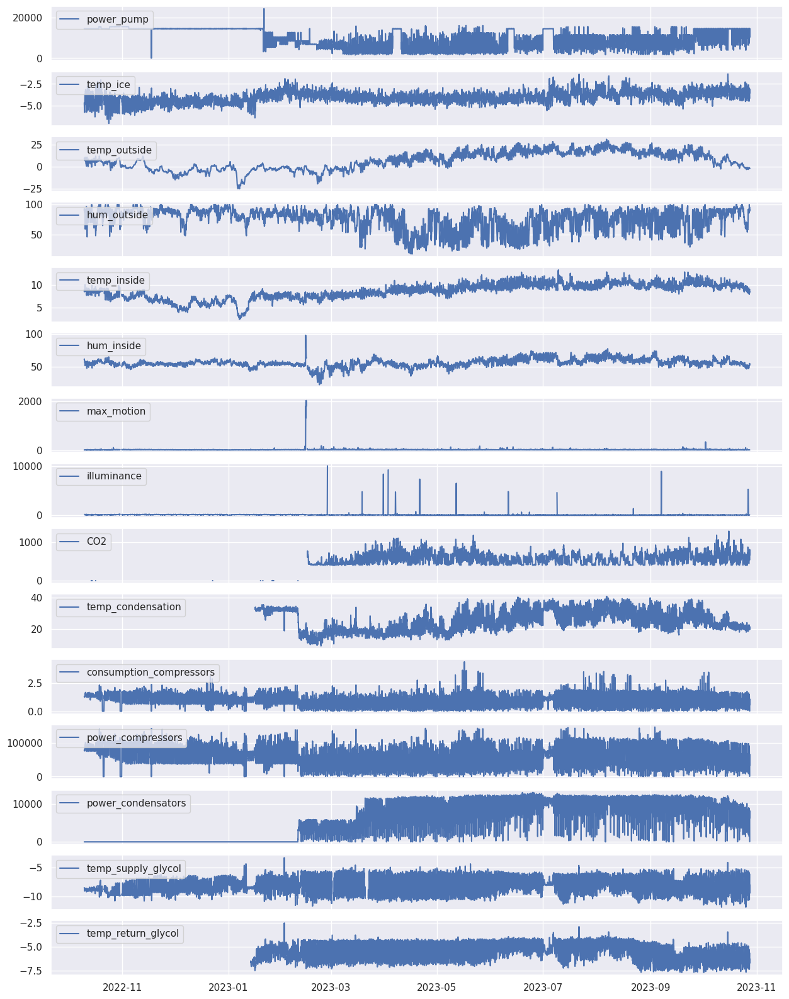

In [9]:
# Из графика ниже видно, что полноценный набор данных по всем параметрам начался с середины февраля
sampled_df = data.set_index('time').resample('1h').mean()

fig, axes = plt.subplots(sampled_df.shape[1], figsize=(15, 20), sharex=True)
for i, col in enumerate(sampled_df.columns):
    axes[i].plot(sampled_df[col], label=col)
    axes[i].legend(loc='upper left')

## <h2>Заполнение пропусков</h2>

In [10]:
data = data[data['time'] > '2023-02-17'].copy()

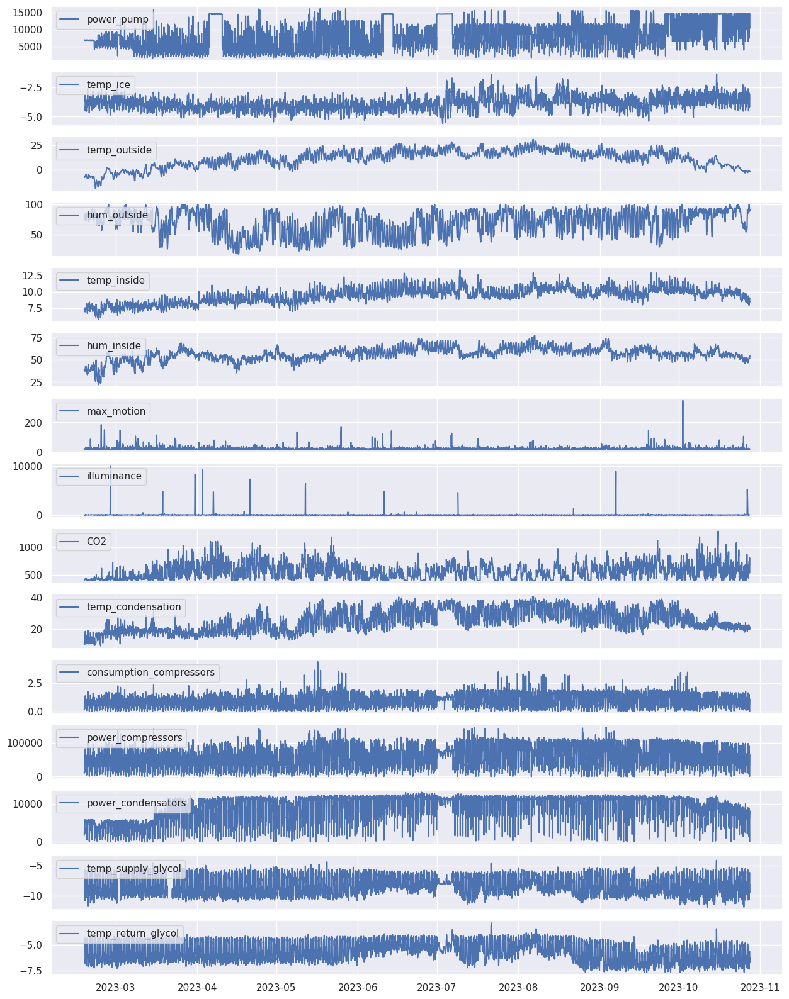

In [170]:
# Из графика ниже видно, что полноценный набор данных по всем параметрам начался с середины февраля
sampled_df = data.set_index('time').resample('1h').mean()

fig, axes = plt.subplots(sampled_df.shape[1], figsize=(15, 20), sharex=True)
for i, col in enumerate(sampled_df.columns):
    axes[i].plot(sampled_df[col], label=col)
    axes[i].legend(loc='upper left')

In [11]:
# Количество пропущенных данных в %
data.isna().sum().sort_values(ascending=False) / len(data)

temp_supply_glycol         0.188100
illuminance                0.159647
temp_return_glycol         0.027363
temp_outside               0.019765
hum_outside                0.019765
temp_inside                0.015852
temp_ice                   0.004399
hum_inside                 0.001027
temp_condensation          0.000758
CO2                        0.000453
power_pump                 0.000423
max_motion                 0.000420
time                       0.000000
consumption_compressors    0.000000
power_condensators         0.000000
power_compressors          0.000000
dtype: float64

In [12]:
# Заполняем данные предыдущими и последующими значениями
data = data.ffill().bfill()
data.isna().sum()

time                       0
power_pump                 0
temp_ice                   0
temp_outside               0
hum_outside                0
temp_inside                0
hum_inside                 0
max_motion                 0
illuminance                0
CO2                        0
temp_condensation          0
consumption_compressors    0
power_compressors          0
power_condensators         0
temp_supply_glycol         0
temp_return_glycol         0
dtype: int64

## <h2>Обработка аномальных значений</h2>

In [13]:
data.describe().T

,count,mean,min,25%,50%,75%,max,std
time,364173,2023-06-23 11:54:14.443245824,2023-02-17 00:01:00,2023-04-21 05:52:00,2023-06-23 11:45:00,2023-08-25 18:07:00,2023-10-27 23:59:00,NaN
power_pump,364173.0,7752.440057,9.965715,5329.35498,6433.294922,11562.789551,16214.39502,4089.333675
temp_ice,364173.0,-3.872665,-5.619792,-4.253606,-3.929688,-3.578125,-1.007812,0.609632
temp_outside,364173.0,11.231066,-19.801016,5.408898,12.8615,17.865081,30.899416,8.702751
hum_outside,364173.0,69.265405,16.016129,54.0,73.050847,86.525,100.0,19.974126
temp_inside,364173.0,9.49968,5.606522,8.682143,9.594445,10.294697,13.4875,1.173811
hum_inside,364173.0,56.599894,17.275,52.724999,56.8,61.340476,79.475002,7.536656
max_motion,364173.0,23.85659,11.75,18.0,19.25,21.0,1100.5,27.859687
illuminance,364173.0,79.999922,0.0,10.1,67.520002,80.16,11445.770086,392.717165
CO2,364173.0,565.191667,400.0,438.416667,538.0,657.0,1458.75,143.565915


### <h2>Температурные показатели</h2>

In [14]:
temp_cols = ['temp_ice', 'temp_outside', 'temp_inside', 'temp_condensation', 'temp_supply_glycol', 'temp_return_glycol']

<Axes: ylabel='Count'>

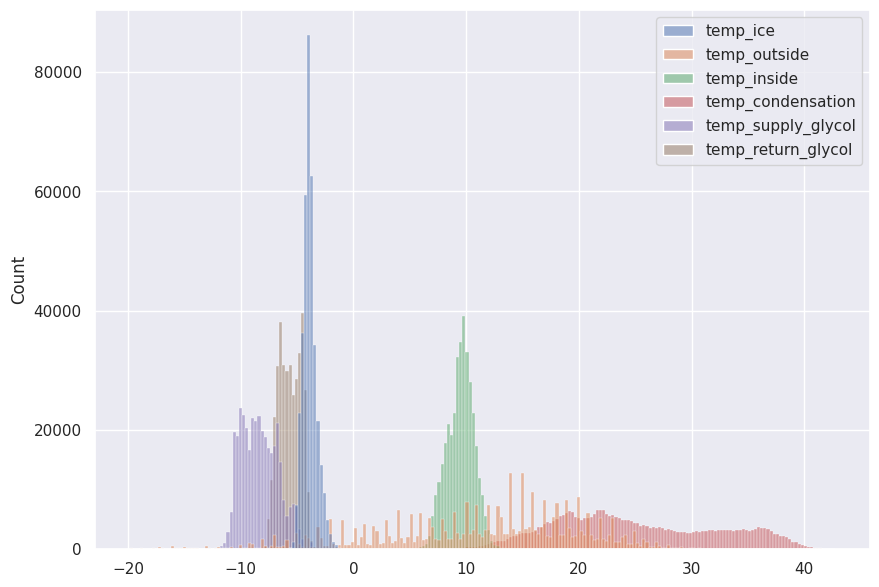

In [15]:
plt.figure(figsize=(10, 7))
sns.histplot(data[temp_cols])

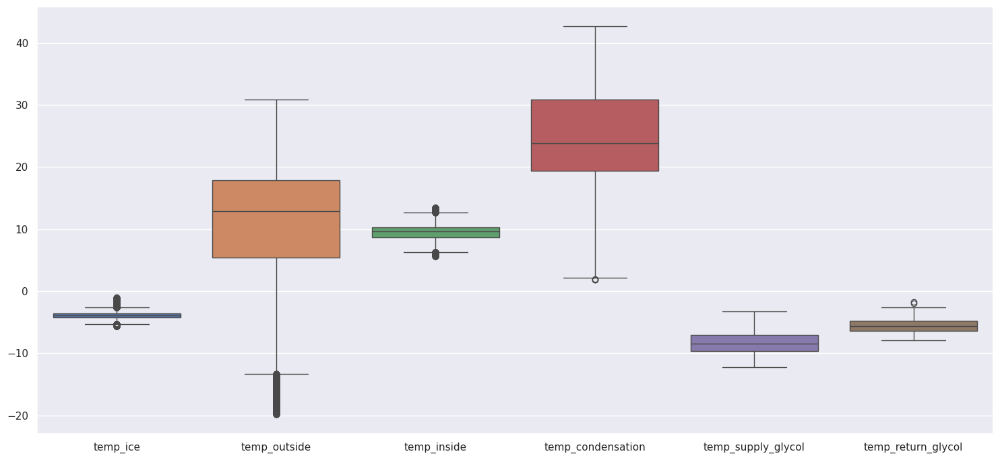

In [17]:
plt.figure(figsize=(15, 7))
sns.boxplot(data[temp_cols])
plt.tight_layout()

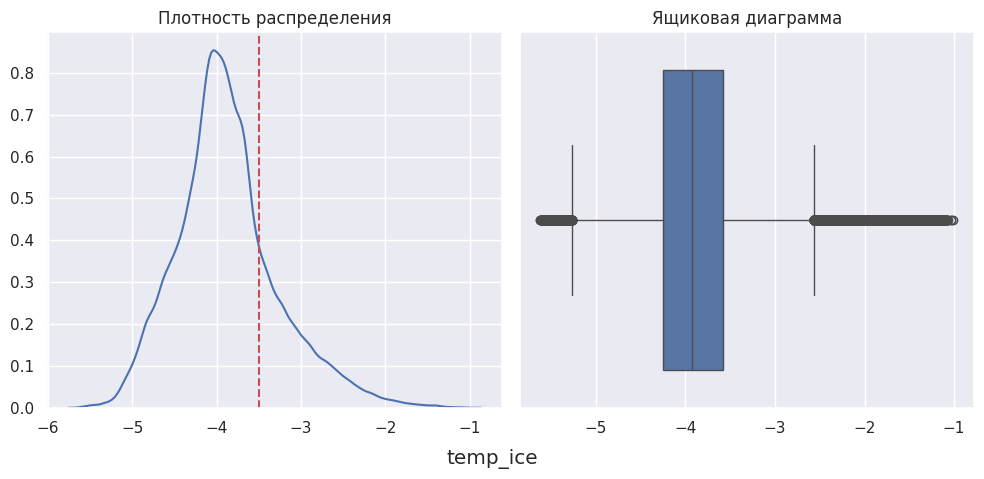

In [39]:
# Выбросов в распределении температуры поверхности льда не наблюдается
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
plt.suptitle('temp_ice', y=0.01)
sns.kdeplot(ax=axes[0], x=data['temp_ice'])
sns.boxplot(ax=axes[1], x=data['temp_ice'])
axes[0].axvline(x=-3.5, color='r', linestyle='--', label='ice setpoint')
axes[0].set(xlabel='', ylabel='', title='Плотность распределения')
axes[1].set(xlabel='', ylabel='', title='Ящиковая диаграмма')
plt.tight_layout()

In [20]:
# mask_df = data[data['time'].between('2023-02-17', '2023-02-20')]
mask_df = data[data['time'].between('2023-10-25', '2023-10-30')]
fig = make_subplots(rows=6, cols=1, shared_xaxes=True, vertical_spacing=0.02)
fig.add_trace(go.Scatter(x=mask_df['time'], y=mask_df['temp_ice'], name='Температура льда'), row=1, col=1)
fig.add_trace(go.Scatter(x=mask_df['time'], y=mask_df['consumption_compressors'], name='Потребление компрессоров'), row=2, col=1)
fig.add_trace(go.Scatter(x=mask_df['time'], y=mask_df['power_pump'], name='Мощность циркуляционного насоса'), row=3, col=1)
fig.add_trace(go.Scatter(x=mask_df['time'], y=mask_df['power_condensators'], name='Мощность конденсаторов'), row=4, col=1)
fig.add_trace(go.Scatter(x=mask_df['time'], y=mask_df['temp_inside'], name='Внутреняя температура'), row=5, col=1)
fig.add_trace(go.Scatter(x=mask_df['time'], y=mask_df['temp_supply_glycol'], name='Температура подачи теплоносителя'), row=6, col=1)
fig.add_trace(go.Scatter(x=mask_df['time'], y=mask_df['temp_return_glycol'], name='Температура возврата теплоносителя'), row=6, col=1)
fig.update_layout(margin=dict(l=10, r=10, t=30, b=10),
                  legend=dict(orientation='h', yanchor='bottom', x=0, y=1.01),
                #   width=1000,
                  height=1000,
                  font_color="#837A4F",
                  title_font_color="#837A4F")
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Температура: %{y:.2f}°C', row=1, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Потребление: %{y:.2f} кВт*ч', row=2, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Мощность: %{y:.2f} Вт', row=3, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Мощность: %{y:.2f} Вт', row=4, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Температура: %{y:.2f}°C', row=5, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Температура: %{y:.2f}°C', row=6, col=1)
fig.update_yaxes(title_text='°C', row=1, col=1)
fig.update_yaxes(title_text='кВт*ч', row=2, col=1)
fig.update_yaxes(title_text='Вт', row=3, col=1)
fig.update_yaxes(title_text='Вт', row=4, col=1)
fig.update_yaxes(title_text='°C', row=5, col=1)
fig.update_yaxes(title_text='°C', row=6, col=1)

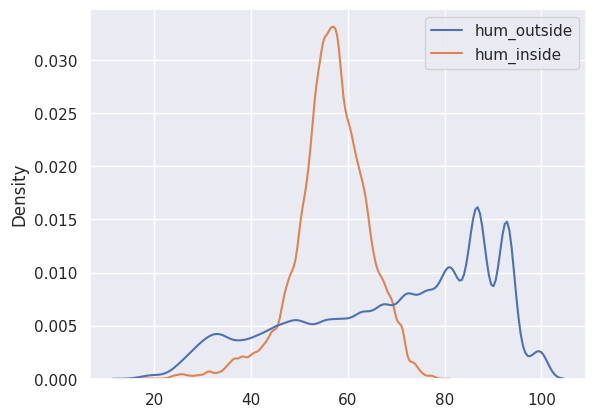

In [178]:
sns.kdeplot(data[['hum_outside', 'hum_inside']])
plt.show()

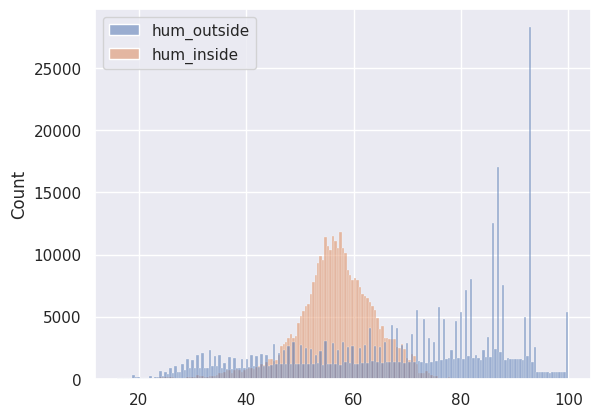

In [179]:
sns.histplot(data[['hum_outside', 'hum_inside']])
plt.show()

### <h2>Данные с многофункционального датчика</h2>

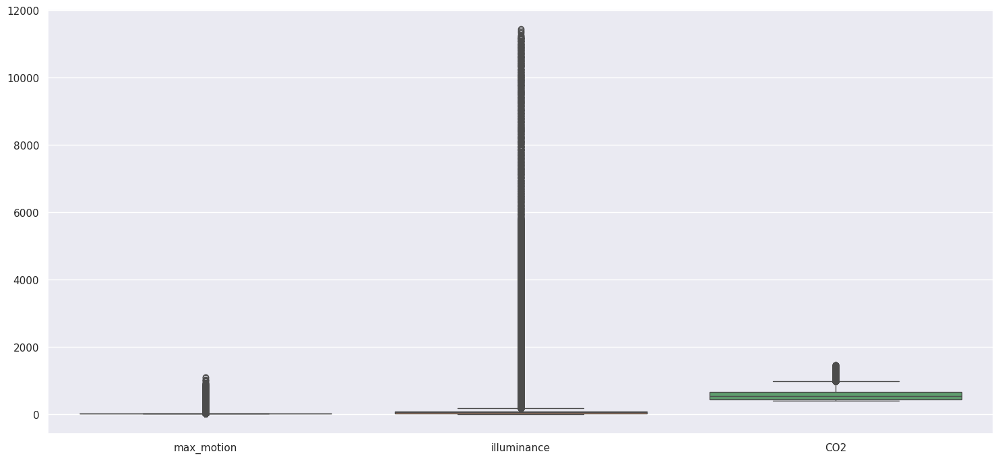

In [180]:
plt.figure(figsize=(15, 7))
sns.boxplot(data[['max_motion', 'illuminance', 'CO2']])
plt.tight_layout()

In [181]:
print(len(data[data['illuminance'] > 1000]))
data.loc[data['illuminance'] > 1000, 'illuminance'] = 1000

1894


In [182]:
print(len(data[data['max_motion'] > 200]))
data.loc[data['max_motion'] > 200, 'max_motion'] = 200

1747


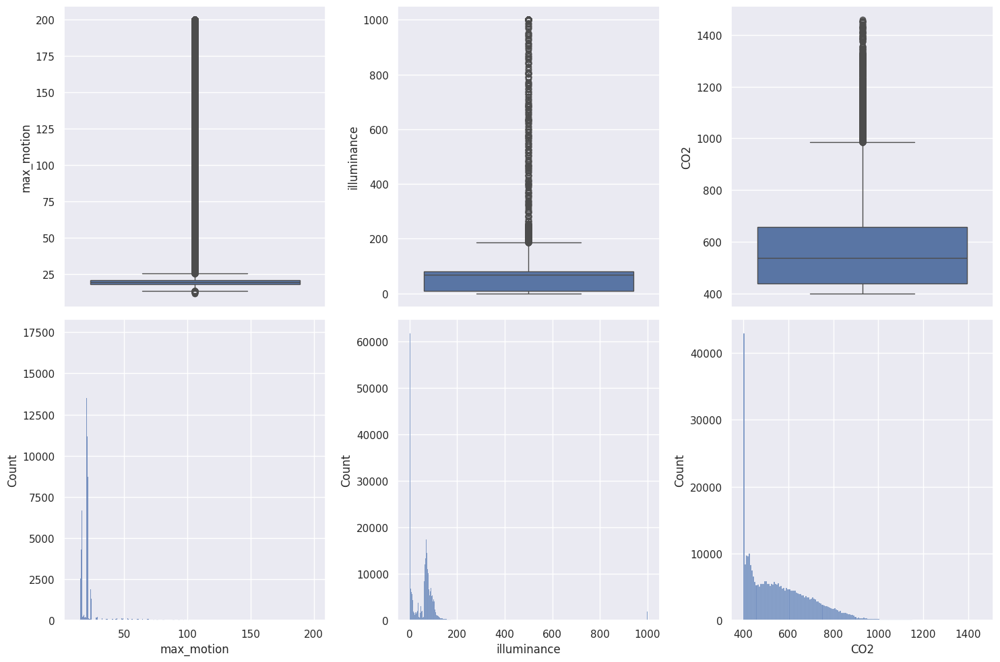

In [183]:
plt.figure(figsize=(15, 10))
plt.subplot(2, 3, 1)
sns.boxplot(data['max_motion'])
plt.subplot(2, 3, 2)
sns.boxplot(data['illuminance'])
plt.subplot(2, 3, 3)
sns.boxplot(data['CO2'])
plt.subplot(2, 3, 4)
sns.histplot(data['max_motion'])
plt.subplot(2, 3, 5)
sns.histplot(data['illuminance'])
plt.subplot(2, 3, 6)
sns.histplot(data['CO2'])

plt.tight_layout()

### <h2>Мощность и потребление элементов холодильной машины</h2>

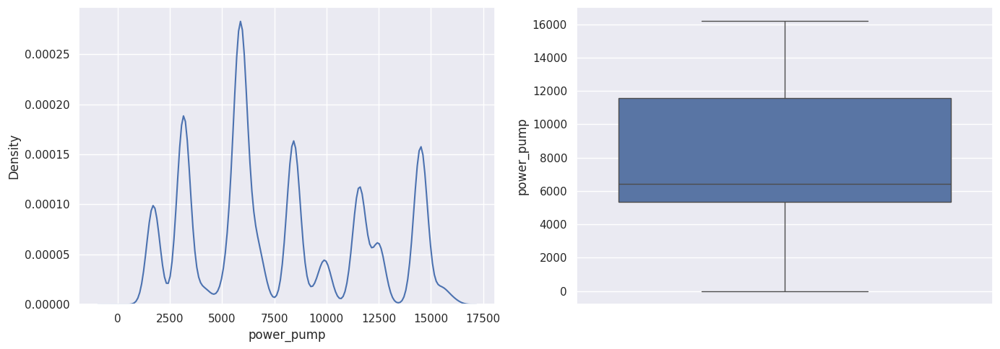

In [184]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.kdeplot(ax=axes[0], x=data['power_pump'])
sns.boxplot(ax=axes[1], y=data['power_pump'])
plt.tight_layout()

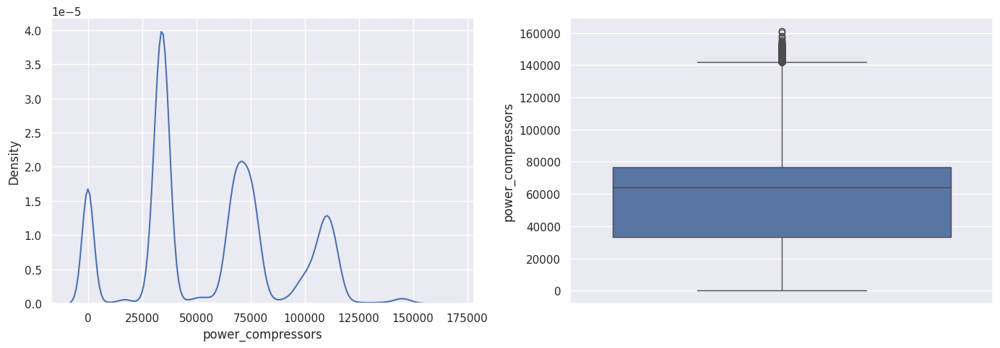

In [185]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.kdeplot(ax=axes[0], x=data['power_compressors'])
sns.boxplot(ax=axes[1], y=data['power_compressors'])
plt.tight_layout()

Из графика плотности распределения мощности работы компрессоров видно 5 пиков. Каждый пик характеризует количество работающих ступеней компрессоров.

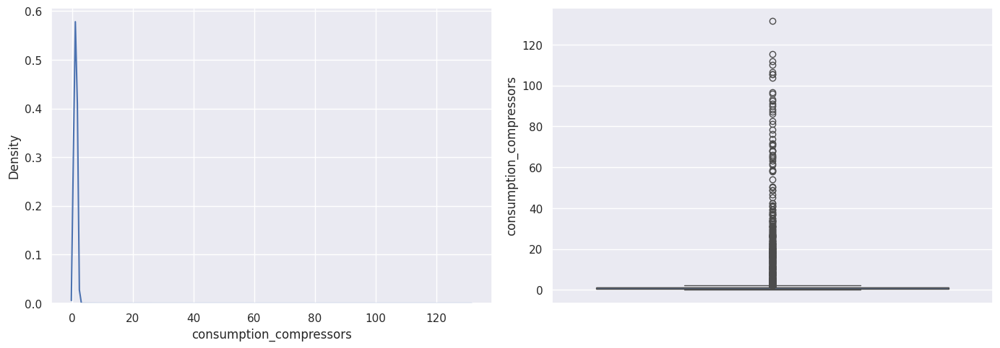

In [186]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.kdeplot(ax=axes[0], x=data['consumption_compressors'])
sns.boxplot(ax=axes[1], y=data['consumption_compressors'])
plt.tight_layout()

В потреблении компрессоров наблюдаются выбросы, которые возникают в результате обрыва передачи данных, из-за чего счетчики накапливают энергию и при восстановлении соединения выдают накопленную сумму.

In [187]:
data.loc[data['consumption_compressors'] > 3, 'consumption_compressors'] = np.NaN
data['consumption_compressors'] = data['consumption_compressors'].ffill()

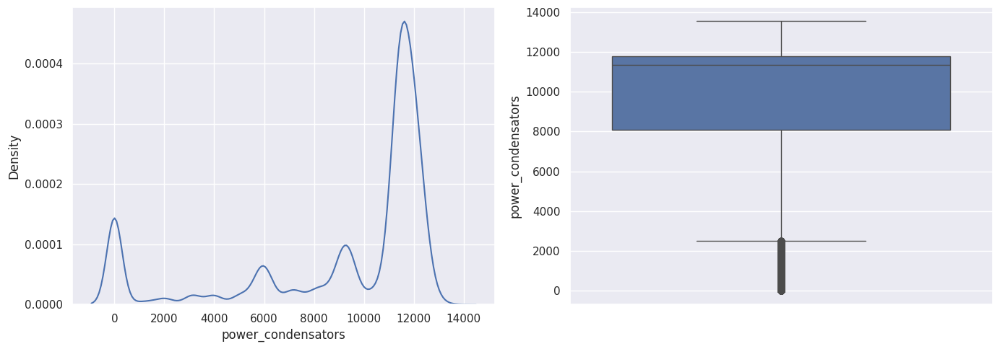

In [188]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.kdeplot(ax=axes[0], x=data['power_condensators'])
sns.boxplot(ax=axes[1], y=data['power_condensators'])
plt.tight_layout()

<Axes: >

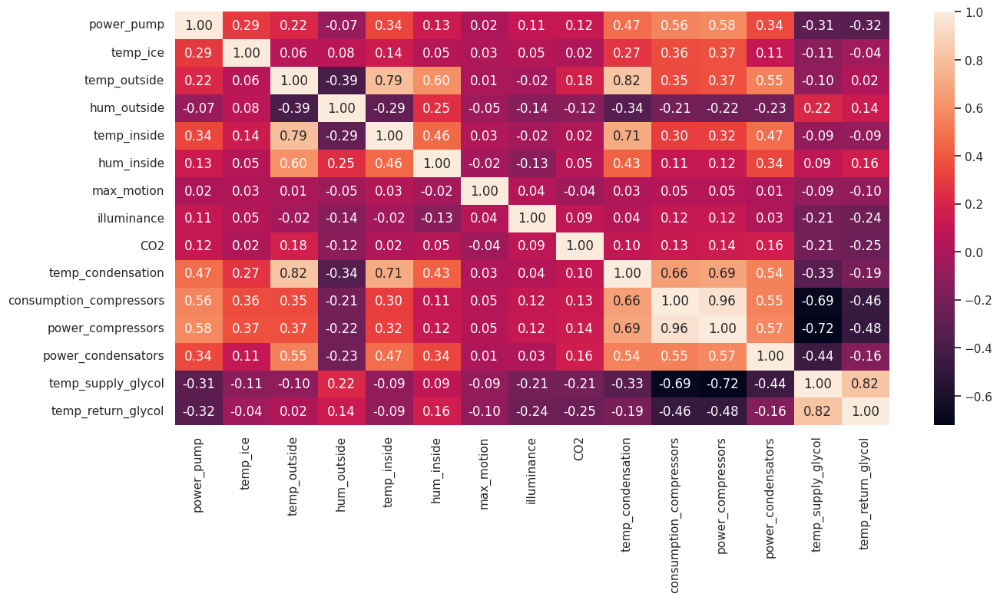

In [238]:
plt.figure(figsize=(15, 7))
sns.heatmap(data.corr(numeric_only=True), annot=True, fmt='.2f')

## <h2>Агрегация данных по временным интервалам</h2>

In [189]:
data.columns

Index(['time', 'power_pump', 'temp_ice', 'temp_outside', 'hum_outside',
       'temp_inside', 'hum_inside', 'max_motion', 'illuminance', 'CO2',
       'temp_condensation', 'consumption_compressors', 'power_compressors',
       'power_condensators', 'temp_supply_glycol', 'temp_return_glycol'],
      dtype='object')

In [46]:
aggregation_cols = dict(
    [(col, 'sum') if col == 'consumption_compressors' else (col, 'mean') 
     for col in data.drop(columns='time').columns]
    )

### <h2>Агрегация по часам</h2>

In [47]:
hour_df = data.groupby(data['time'].dt.round('h')).agg(aggregation_cols)
hour_df.describe()

,power_pump,temp_ice,temp_outside,hum_outside,temp_inside,hum_inside,max_motion,illuminance,CO2,temp_condensation,consumption_compressors,power_compressors,power_condensators,temp_supply_glycol,temp_return_glycol
count,6073.000000,6073.000000,6073.000000,6073.000000,6073.000000,6073.000000,6073.000000,6073.000000,6073.000000,6073.000000,6073.000000,6073.000000,6073.000000,6073.000000,6073.000000
mean,7751.990929,-3.873013,11.229203,69.273804,9.499493,56.600960,23.855023,79.929057,565.183630,24.974545,57.137798,57280.174585,9220.402229,-8.306125,-5.617713
std,3820.474532,0.558218,8.697975,19.871247,1.162330,7.474504,10.664488,349.508606,131.612936,6.995045,31.401723,30648.584913,3158.295006,1.506802,0.938671
min,1695.799141,-5.571637,-19.503671,17.000000,5.855757,20.111475,15.873155,0.000000,401.320784,9.966514,0.000000,7.296780,-0.249958,-12.030847,-7.723443
25%,4602.683197,-4.208803,5.415366,54.031831,8.692220,52.803178,19.456967,15.313334,451.622881,19.276510,33.040104,33152.074948,7085.208067,-9.593729,-6.417797
50%,6938.414675,-3.921332,12.815697,73.478814,9.600212,56.787288,20.932377,65.927798,544.809322,23.753623,52.169791,53006.211698,11113.908152,-8.429016,-5.629508
75%,10649.119236,-3.582133,17.848871,86.250000,10.285914,61.260451,25.016393,80.501016,652.729508,30.775836,79.671874,79563.299476,11584.215203,-7.054068,-4.715082
max,16091.122923,-1.308658,30.848093,100.000000,13.345605,77.735381,354.881356,9713.965930,1202.598361,40.956774,207.692430,148184.120961,13111.835282,-3.800000,-2.821311


In [48]:
hour_df = hour_df.reset_index()

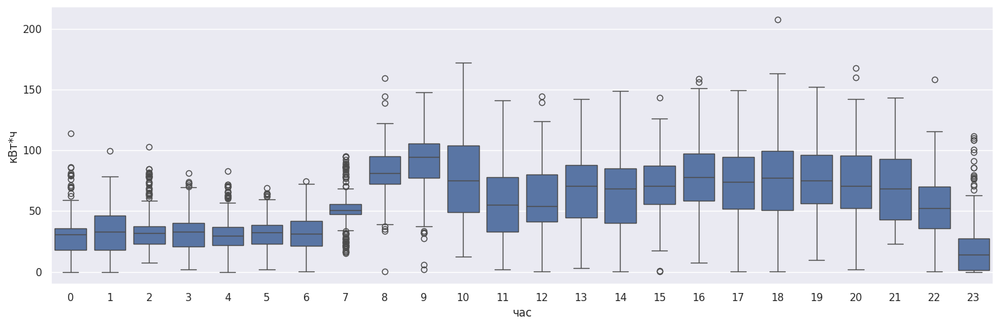

In [52]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 1, 1)
sns.boxplot(data=hour_df, x=hour_df['time'].dt.hour, y=hour_df['consumption_compressors'])
# plt.title('Потребление компрессоров')
plt.ylabel('кВт*ч')
plt.xlabel('час')

plt.tight_layout()

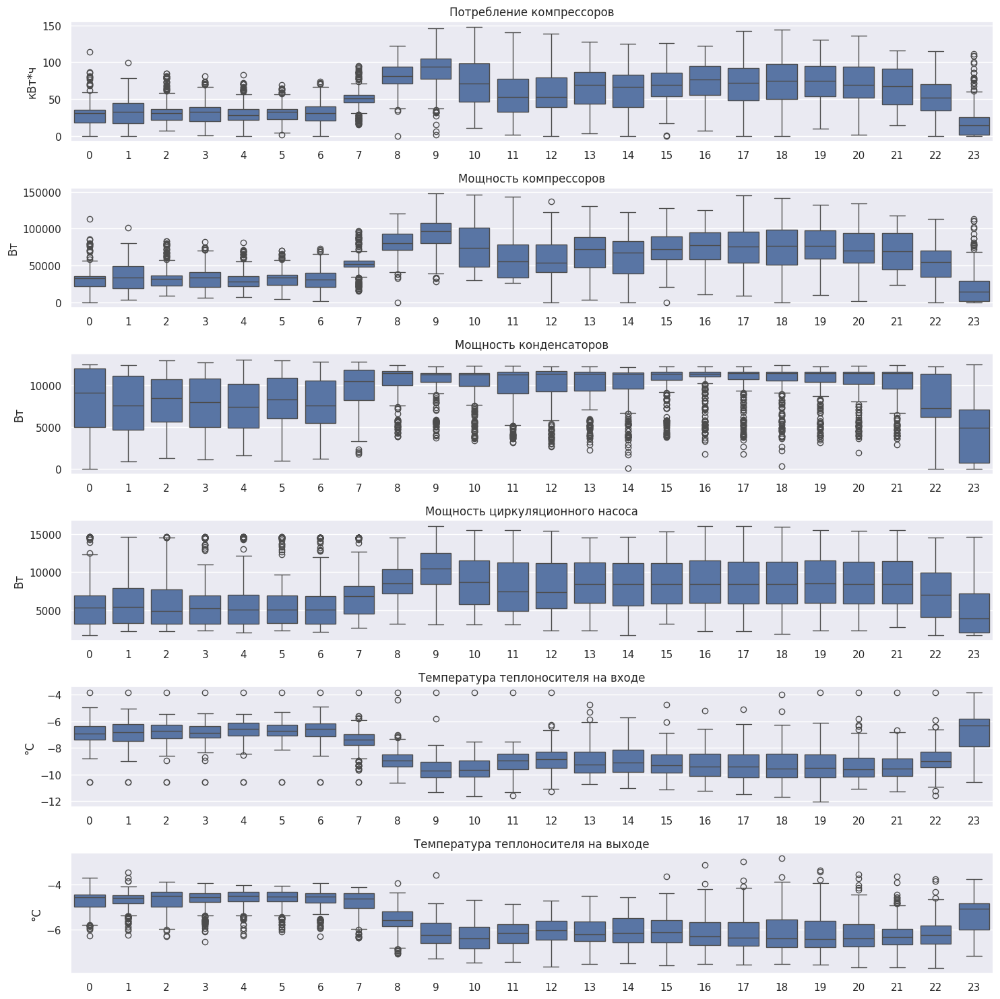

In [219]:
plt.figure(figsize=(15, 15))
plt.subplot(6, 1, 1)
sns.boxplot(data=hour_df, x=hour_df['time'].dt.hour, y=hour_df['consumption_compressors'])
plt.title('Потребление компрессоров')
plt.ylabel('кВт*ч')
plt.xlabel('')
plt.subplot(6, 1, 2)
sns.boxplot(data=hour_df, x=hour_df['time'].dt.hour, y=hour_df['power_compressors'])
plt.title('Мощность компрессоров')
plt.ylabel('Вт')
plt.xlabel('')
plt.subplot(6, 1, 3)
sns.boxplot(data=hour_df, x=hour_df['time'].dt.hour, y=hour_df['power_condensators'])
plt.title('Мощность конденсаторов')
plt.ylabel('Вт')
plt.xlabel('')
plt.subplot(6, 1, 4)
sns.boxplot(data=hour_df, x=hour_df['time'].dt.hour, y=hour_df['power_pump'])
plt.title('Мощность циркуляционного насоса')
plt.ylabel('Вт')
plt.xlabel('')
plt.subplot(6, 1, 5)
sns.boxplot(data=hour_df, x=hour_df['time'].dt.hour, y=hour_df['temp_supply_glycol'])
plt.title('Температура теплоносителя на входе')
plt.ylabel('°C')
plt.xlabel('')
plt.subplot(6, 1, 6)
sns.boxplot(data=hour_df, x=hour_df['time'].dt.hour, y=hour_df['temp_return_glycol'])
plt.title('Температура теплоносителя на выходе')
plt.ylabel('°C')
plt.xlabel('')

plt.tight_layout()

In [234]:
fig = make_subplots(rows=6, cols=1, shared_xaxes=True, vertical_spacing=0.02)
fig.add_trace(go.Scatter(x=hour_df['time'], y=hour_df['consumption_compressors'], name='Потребление компрессоров'), row=1, col=1)
fig.add_trace(go.Scatter(x=hour_df['time'], y=hour_df['power_pump'], name='Мощность циркуляционного насоса'), row=2, col=1)
fig.add_trace(go.Scatter(x=hour_df['time'], y=hour_df['power_condensators'], name='Мощность конденсаторов'), row=3, col=1)
fig.add_trace(go.Scatter(x=hour_df['time'], y=hour_df['temp_outside'], name='Внешняя температура'), row=4, col=1)
fig.add_trace(go.Scatter(x=hour_df['time'], y=hour_df['temp_ice'], name='Температура льда'), row=5, col=1)
fig.add_trace(go.Scatter(x=hour_df['time'], y=hour_df['temp_supply_glycol'], name='Температура подачи теплоносителя'), row=6, col=1)
fig.add_trace(go.Scatter(x=hour_df['time'], y=hour_df['temp_return_glycol'], name='Температура возврата теплоносителя'), row=6, col=1)
fig.update_layout(margin=dict(l=10, r=10, t=30, b=10),
                  legend=dict(orientation='h', yanchor='bottom', x=0, y=1.01),
                #   width=1000,
                  height=1000,
                  font_color="#837A4F",
                  title_font_color="#837A4F")
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Потребление: %{y:.2f} кВт*ч', row=1, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Мощность: %{y:.2f} Вт', row=2, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Мощность: %{y:.2f} Вт', row=3, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Температура: %{y:.2f}°C', row=4, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Температура: %{y:.2f}°C', row=5, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Температура: %{y:.2f}°C', row=6, col=1)
fig.update_yaxes(title_text='кВт*ч', row=1, col=1)
fig.update_yaxes(title_text='Вт', row=2, col=1)
fig.update_yaxes(title_text='Вт', row=3, col=1)
fig.update_yaxes(title_text='°C', row=4, col=1)
fig.update_yaxes(title_text='°C', row=5, col=1)
fig.update_yaxes(title_text='°C', row=6, col=1)

<Axes: >

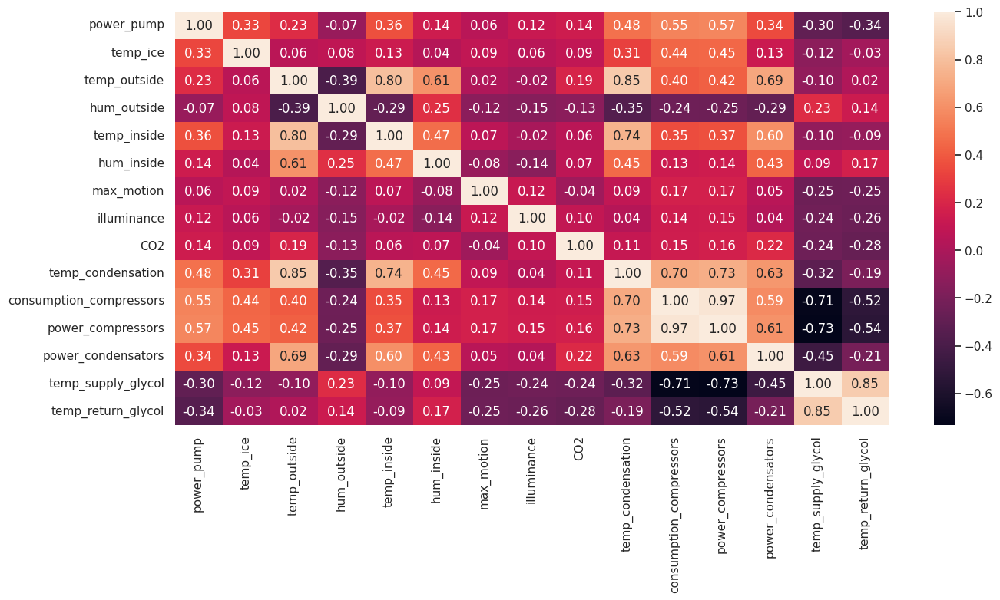

In [237]:
plt.figure(figsize=(15, 7))
sns.heatmap(hour_df.corr(numeric_only=True), annot=True, fmt='.2f')

### <h2>Агрегация по суткам</h2>

In [224]:
date_df = data.groupby(pd.to_datetime(data['time'].dt.date)).agg(aggregation_cols).reset_index()

In [239]:
fig = make_subplots(rows=6, cols=1, shared_xaxes=True, vertical_spacing=0.02)
fig.add_trace(go.Scatter(x=date_df['time'], y=date_df['consumption_compressors'], name='Потребление компрессоров'), row=1, col=1)
fig.add_trace(go.Scatter(x=date_df['time'], y=date_df['power_pump'], name='Мощность циркуляционного насоса'), row=2, col=1)
fig.add_trace(go.Scatter(x=date_df['time'], y=date_df['power_condensators'], name='Мощность конденсаторов'), row=3, col=1)
fig.add_trace(go.Scatter(x=date_df['time'], y=date_df['temp_outside'], name='Внешняя температура'), row=4, col=1)
fig.add_trace(go.Scatter(x=date_df['time'], y=date_df['temp_ice'], name='Температура льда'), row=5, col=1)
fig.add_trace(go.Scatter(x=date_df['time'], y=date_df['temp_supply_glycol'], name='Температура подачи теплоносителя'), row=6, col=1)
fig.add_trace(go.Scatter(x=date_df['time'], y=date_df['temp_return_glycol'], name='Температура возврата теплоносителя'), row=6, col=1)
fig.update_layout(margin=dict(l=10, r=10, t=30, b=10),
                  legend=dict(orientation='h', yanchor='bottom', x=0, y=1.01),
                #   width=1000,
                  height=1000,
                  font_color="#837A4F",
                  title_font_color="#837A4F")
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Потребление: %{y:.2f} кВт*ч', row=1, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Мощность: %{y:.2f} Вт', row=2, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Мощность: %{y:.2f} Вт', row=3, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Температура: %{y:.2f}°C', row=4, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Температура: %{y:.2f}°C', row=5, col=1)
fig.update_traces(hoverinfo='all', hovertemplate='Дата и время: %{x}<br>Температура: %{y:.2f}°C', row=6, col=1)
fig.update_yaxes(title_text='кВт*ч', row=1, col=1)
fig.update_yaxes(title_text='Вт', row=2, col=1)
fig.update_yaxes(title_text='Вт', row=3, col=1)
fig.update_yaxes(title_text='°C', row=4, col=1)
fig.update_yaxes(title_text='°C', row=5, col=1)
fig.update_yaxes(title_text='°C', row=6, col=1)

<Axes: >

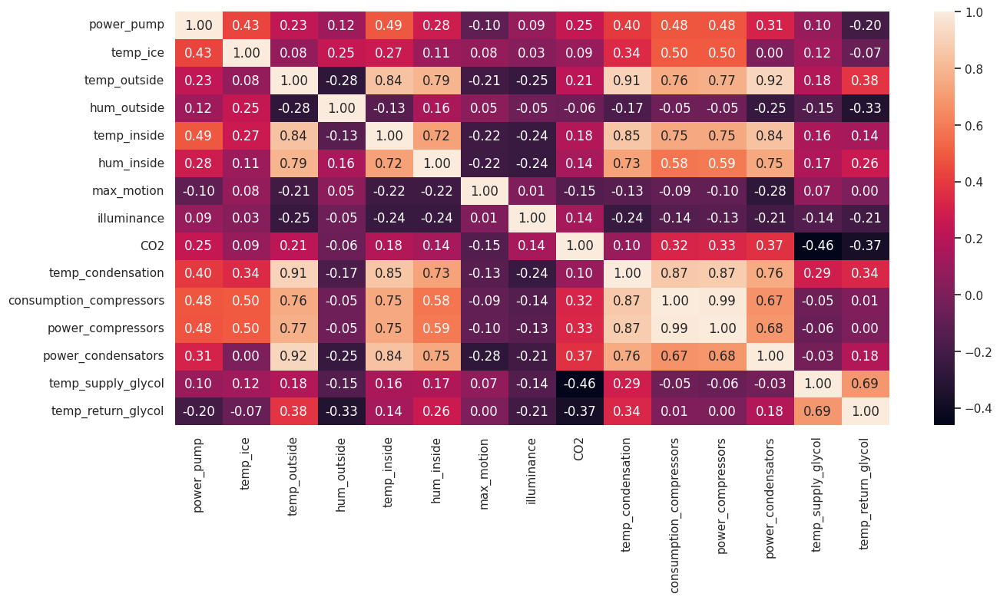

In [241]:
plt.figure(figsize=(15, 7))
sns.heatmap(date_df.corr(numeric_only=True), annot=True, fmt='.2f')

In [247]:
# Потребление компрессоров по месяцам
data.groupby(data['time'].apply(lambda x: str(x.year) + '-' + str(x.month).rjust(2, '0')))[['consumption_compressors']].sum().astype('int')

,consumption_compressors
time,
2023-02,11114
2023-03,32326
2023-04,34948
2023-05,40623
2023-06,38144
2023-07,49900
2023-08,49692
2023-09,46923
2023-10,35655


In [249]:
# data.to_csv('../data/transformed_data.csv', index=False)